In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime
from matplotlib import cycler
import calendar
import time
from cvxpy import *
import statsmodels.formula.api as smf
from mpl_toolkits.mplot3d import Axes3D

plt.style.use('ggplot')
plt.rcParams.update({'font.size': 20})

## Problem 1: Exploratory Data Analysis

In [2]:
train_data = pd.read_csv('HW4_Train_data.csv')
train_data.head()

,UNIX Timestamp (seconds),"Start Time (GMT-0800,PST)","End Time (GMT-0800,PST)",Bldg1 (kWh),Bldg2 (kWh),Bldg3 (kWh),Bldg4 (kWh),Bldg5 (kWh),Bldg6 (kWh),Bldg7 (kWh),...,Bldg14 (kWh),Bldg15 (kWh),Bldg16 (kWh),Bldg17 (kWh),Bldg18 (kWh),Bldg19 (kWh),Bldg20 (kWh),Bldg21 (kWh),Bldg22 (kWh),Bldg23 (kWh)
0,1388851200,1/5/14 00:00,1/5/14 00:59,0.19,0.97,0.03,0.02,0.26,1.47,0.10,...,0.24,1.76,0.11,0.09,0.61,0.03,1.70,3.23,0.14,0.99
1,1388854800,1/5/14 01:00,1/5/14 01:59,0.19,0.83,0.10,0.02,0.26,1.48,0.20,...,0.40,1.49,0.06,0.10,0.77,0.03,1.78,2.42,0.12,0.93
2,1388858400,1/5/14 02:00,1/5/14 02:59,0.19,0.89,0.08,0.08,0.24,1.45,0.10,...,0.36,1.57,0.05,0.08,0.75,0.03,1.68,2.31,0.13,0.47
3,1388862000,1/5/14 03:00,1/5/14 03:59,0.19,0.83,0.03,0.02,0.17,1.45,0.18,...,0.33,1.31,0.06,0.13,0.34,0.02,1.70,2.72,0.14,0.58
4,1388865600,1/5/14 04:00,1/5/14 04:59,0.19,0.83,0.03,0.02,0.18,1.69,0.14,...,0.29,0.03,0.06,0.16,0.15,0.03,1.75,0.69,0.11,0.44


In [3]:
mean_data = train_data.mean(axis=0)
mean_data = mean_data.drop(['UNIX Timestamp (seconds)'])
#print(mean_data)
std_data = train_data.std(axis=0)
std_data = std_data.drop(['UNIX Timestamp (seconds)'])
#print(std_data)

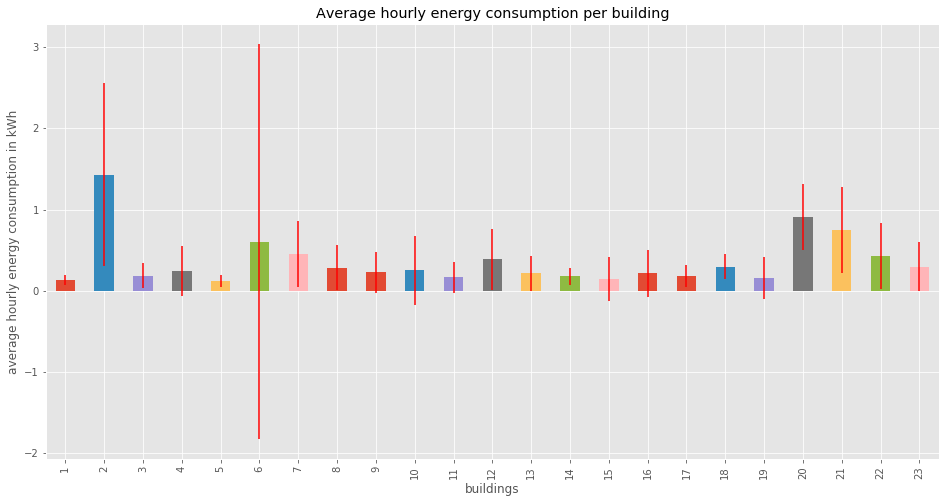

In [4]:
fig, ax = plt.subplots(figsize=(16, 8))
mean_data.plot(yerr=std_data, kind='bar', ecolor='red')
labels = ['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23']
plt.title('Average hourly energy consumption per building')
plt.xlabel('buildings')
plt.ylabel('average hourly energy consumption in kWh')
ax.set_xticklabels(labels)
plt.savefig('average_hourly_energy_consumption.png')

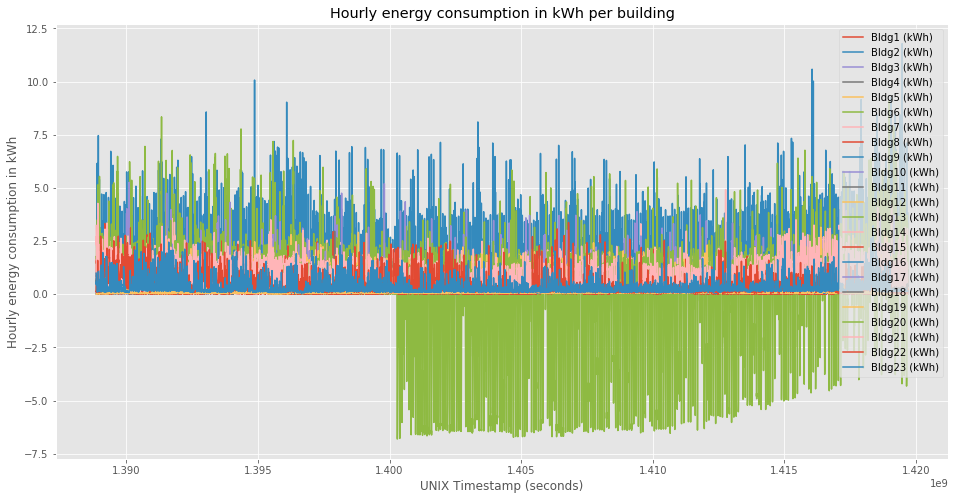

In [5]:
plt.figure(figsize=(16, 8))
for column in train_data.columns[3:]:
    plt.plot(train_data['UNIX Timestamp (seconds)'], train_data[column], label=column)
plt.xlabel('UNIX Timestamp (seconds)')
plt.ylabel('Hourly energy consumption in kWh')
plt.title('Hourly energy consumption in kWh per building')
plt.legend()
plt.savefig('hourly_energy_consumption.png')
plt.show()

In [6]:
train_data = train_data.drop(['Bldg6 (kWh)'], axis=1)

In [7]:
train_data.head()

,UNIX Timestamp (seconds),"Start Time (GMT-0800,PST)","End Time (GMT-0800,PST)",Bldg1 (kWh),Bldg2 (kWh),Bldg3 (kWh),Bldg4 (kWh),Bldg5 (kWh),Bldg7 (kWh),Bldg8 (kWh),...,Bldg14 (kWh),Bldg15 (kWh),Bldg16 (kWh),Bldg17 (kWh),Bldg18 (kWh),Bldg19 (kWh),Bldg20 (kWh),Bldg21 (kWh),Bldg22 (kWh),Bldg23 (kWh)
0,1388851200,1/5/14 00:00,1/5/14 00:59,0.19,0.97,0.03,0.02,0.26,0.10,0.10,...,0.24,1.76,0.11,0.09,0.61,0.03,1.70,3.23,0.14,0.99
1,1388854800,1/5/14 01:00,1/5/14 01:59,0.19,0.83,0.10,0.02,0.26,0.20,0.11,...,0.40,1.49,0.06,0.10,0.77,0.03,1.78,2.42,0.12,0.93
2,1388858400,1/5/14 02:00,1/5/14 02:59,0.19,0.89,0.08,0.08,0.24,0.10,0.11,...,0.36,1.57,0.05,0.08,0.75,0.03,1.68,2.31,0.13,0.47
3,1388862000,1/5/14 03:00,1/5/14 03:59,0.19,0.83,0.03,0.02,0.17,0.18,0.11,...,0.33,1.31,0.06,0.13,0.34,0.02,1.70,2.72,0.14,0.58
4,1388865600,1/5/14 04:00,1/5/14 04:59,0.19,0.83,0.03,0.02,0.18,0.14,0.09,...,0.29,0.03,0.06,0.16,0.15,0.03,1.75,0.69,0.11,0.44


In [8]:
array_4D = np.zeros((len(train_data.columns[3:])*len(train_data), 5))
max_data = train_data.max(axis=0)
j = 0
for build_index, building in enumerate(train_data.columns[3:]):
    for i in range(len(train_data)):
        value = datetime.datetime.fromtimestamp(train_data['UNIX Timestamp (seconds)'].iloc[i])
        week_of_year = int(value.strftime('%W'))
        day_of_week = int(value.strftime('%w'))
        hour_of_day = int(value.strftime('%-H'))
        array_4D[j, :] = [build_index, week_of_year, day_of_week, hour_of_day, train_data[building].iloc[i]/max_data[building]]
        j += 1

In [9]:
train_data = pd.DataFrame(array_4D, columns=['building_index', 'week_of_year', 'day_of_week', 'hour_of_day', 'energy_consumption'])
train_data.head()

,building_index,week_of_year,day_of_week,hour_of_day,energy_consumption
0,0.0,0.0,6.0,8.0,0.234568
1,0.0,0.0,6.0,9.0,0.234568
2,0.0,0.0,6.0,10.0,0.234568
3,0.0,0.0,6.0,11.0,0.234568
4,0.0,0.0,6.0,12.0,0.234568


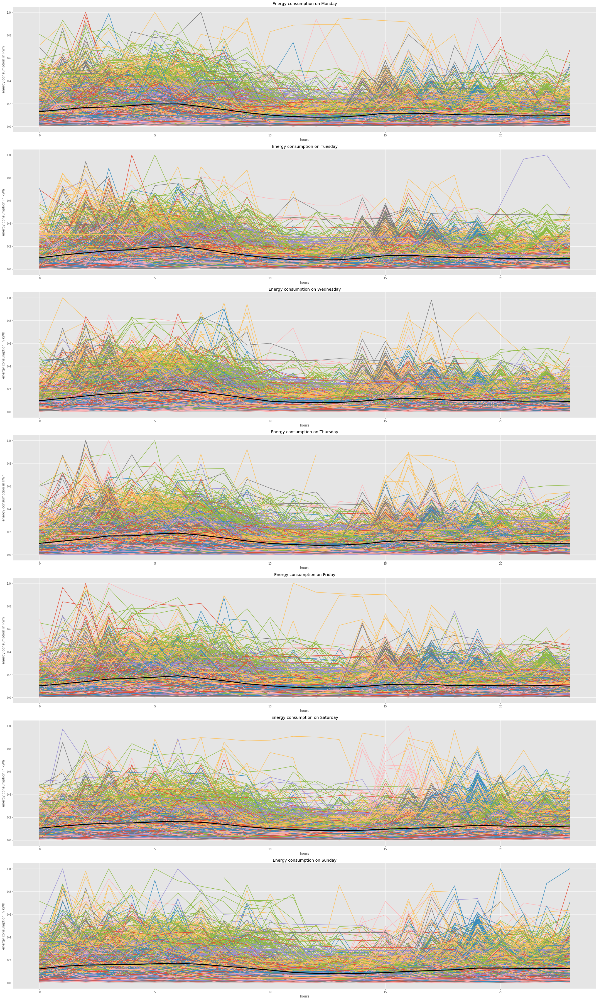

In [11]:
plt.figure(figsize=(30, 50))
day_of_week = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
for i in range(int(train_data['day_of_week'].max())+1):
    num = 711+i
    plt.subplot(num)
    for week in range(int(train_data['week_of_year'].max())):
        for building in range(int(train_data['building_index'].max())):
            plt.plot(train_data[(train_data['day_of_week'] == i) & (train_data['week_of_year'] == week) & (train_data['building_index'] == building)].groupby('hour_of_day').mean()['energy_consumption'])
    plt.plot(train_data[(train_data['day_of_week'] == i)].groupby('hour_of_day').mean()['energy_consumption'], color='black', linestyle='-', linewidth=3)
    plt.xlabel('hours')
    plt.ylabel('energy consumption in kWh')
    plt.title('Energy consumption on '+ day_of_week[i])
    plt.tight_layout()

plt.savefig('weekly_energy_consumption.png')
plt.show()

## Problem 2: Average Model

In [12]:
test_data = pd.read_csv('HW4_Test_data.csv')
test_data.head()

,TestTime,TestBldg
0,9/7/14 0:00,0.094276
1,9/7/14 1:00,0.037037
2,9/7/14 2:00,0.040404
3,9/7/14 3:00,0.037037
4,9/7/14 4:00,0.037037


In [13]:
def convert_time_woy(time):
    return int(datetime.datetime.strptime(time, '%m/%d/%y %H:%M').strftime('%W'))
def convert_time_dow(time):
    return int(datetime.datetime.strptime(time, '%m/%d/%y %H:%M').strftime('%w'))
def convert_time_how(time):
    return int(datetime.datetime.strptime(time, '%m/%d/%y %H:%M').strftime('%-H'))

test_data['week_of_year'] = test_data['TestTime'].apply(convert_time_woy)
test_data['day_of_week'] = test_data['TestTime'].apply(convert_time_dow)
test_data['hour_of_day'] = test_data['TestTime'].apply(convert_time_how)
test_data = test_data.rename(index=str, columns={"TestBldg": "energy_consumption"})
test_data.head()

,TestTime,energy_consumption,week_of_year,day_of_week,hour_of_day
0,9/7/14 0:00,0.094276,35,0,0
1,9/7/14 1:00,0.037037,35,0,1
2,9/7/14 2:00,0.040404,35,0,2
3,9/7/14 3:00,0.037037,35,0,3
4,9/7/14 4:00,0.037037,35,0,4


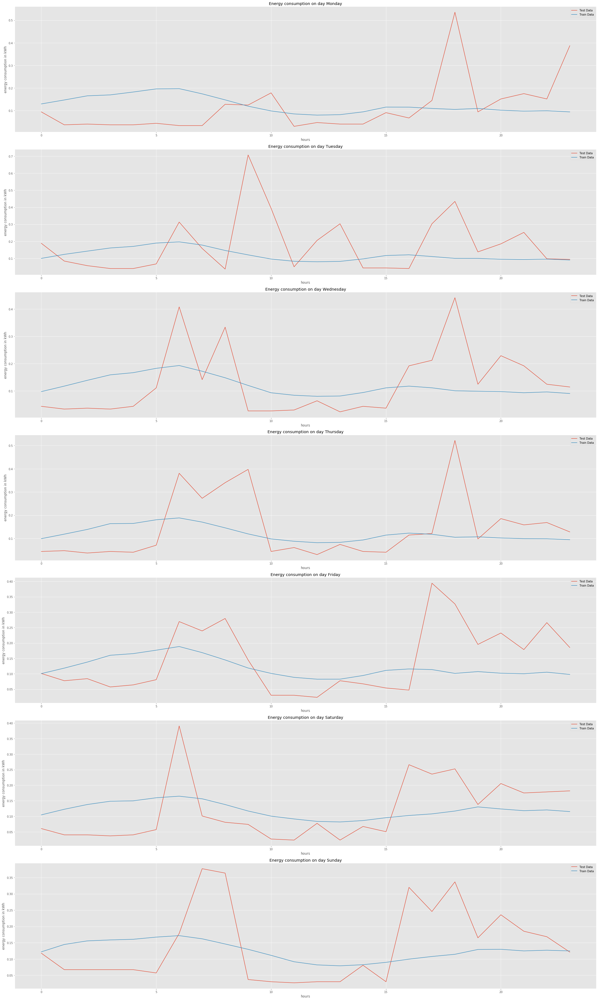

In [14]:
plt.figure(figsize=(30, 50))
day_of_week = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
for i in range(int(train_data['day_of_week'].max()) + 1):
    num = 711+i
    plt.subplot(num)
    plt.plot(test_data[(test_data['day_of_week'] == i)]['energy_consumption'].values, label='Test Data')
    plt.plot(train_data[(train_data['day_of_week'] == i)].groupby('hour_of_day').mean()['energy_consumption'].values, label='Train Data')
    plt.xlabel('hours')
    plt.ylabel('energy consumption in kWh')
    plt.title('Energy consumption on day '+ day_of_week[i])
    plt.legend()
    plt.tight_layout()

plt.savefig('test_weekly_energy_consumption.png')
plt.show()

In [15]:
def mean_absolute_error(test_data, prediction):
    return 1/len(test_data)*sum(np.abs(prediction-test_data))

for i in range(int(train_data['day_of_week'].max())+1):
    mae = mean_absolute_error(test_data[(test_data['day_of_week'] == i)]['energy_consumption'].values, train_data[(train_data['day_of_week'] == i) & (train_data['week_of_year'] == 35)].groupby('hour_of_day').mean()['energy_consumption'].values)
    print('Mean Absolute Error for '+str(day_of_week[i])+' ', mae)

mae = mean_absolute_error(test_data.groupby('hour_of_day')['energy_consumption'].mean().values, train_data[(train_data['week_of_year'] == 35)].groupby('hour_of_day').mean()['energy_consumption'].values)
print('Mean Absolute Error for the week ', mae)

Mean Absolute Error for Monday  0.0914933113255744
Mean Absolute Error for Tuesday  0.131314096409584
Mean Absolute Error for Wednesday  0.08638878348026759
Mean Absolute Error for Thursday  0.09147819308562968
Mean Absolute Error for Friday  0.0849193937660678
Mean Absolute Error for Saturday  0.07739765566884112
Mean Absolute Error for Sunday  0.09286283434443943
Mean Absolute Error for the week  0.07076387818853486


## Problem 3: Autoregressive with eXogeneous Inputs Model (ARX)

In [16]:
x = train_data['energy_consumption'].values
mean_hour_per_day = train_data.groupby('hour_of_day').mean()
mean_hour_per_day = mean_hour_per_day.reset_index()
mean = np.zeros((len(x), 1))
phi = np.zeros((len(x), 3))
for i in range(len(x)):
    phi[i, :] = [x[i-1], x[i-2], x[i-3]]
    mean[i] = mean_hour_per_day[mean_hour_per_day['hour_of_day'] == train_data['hour_of_day'].iloc[i]]['energy_consumption']
train_data['mean'] = mean
train_data['L_1'] = phi[:, 0]
train_data['L_2'] = phi[:, 1]
train_data['L_3'] = phi[:, 2]

In [17]:
model = smf.ols(formula='energy_consumption - mean ~ L_1 + L_2 + L_3', data=train_data).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:     energy_consumption   R-squared:                       0.503
Model:                            OLS   Adj. R-squared:                  0.503
Method:                 Least Squares   F-statistic:                 6.357e+04
Date:                Tue, 03 Apr 2018   Prob (F-statistic):               0.00
Time:                        21:02:14   Log-Likelihood:             2.0135e+05
No. Observations:              188496   AIC:                        -4.027e+05
Df Residuals:                  188492   BIC:                        -4.026e+05
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0301      0.000    101.667      0.0

In [18]:
y = test_data['energy_consumption'].values
phi_y = np.zeros((len(y), 3))
mean_y = np.zeros((len(y), 1))
for i in range(len(y)):
    phi_y[i, :] = [y[i-1], y[i-2], y[i-3]]
    mean_y[i] = mean_hour_per_day[mean_hour_per_day['hour_of_day'] == test_data['hour_of_day'].iloc[i]]['energy_consumption']

test_data['mean'] = mean_y
test_data['L_1'] = phi_y[:, 0]
test_data['L_2'] = phi_y[:, 1]
test_data['L_3'] = phi_y[:, 2]    
    
prediction = model.predict(test_data)

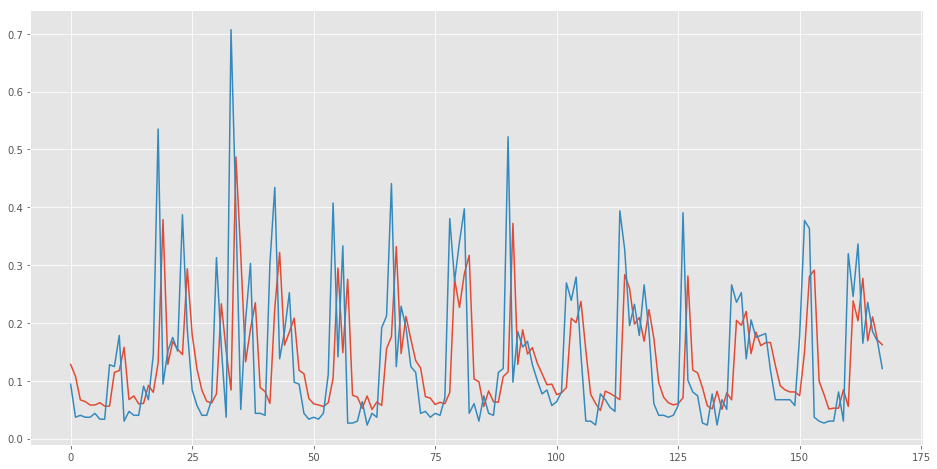

In [19]:
plt.figure(figsize=(16, 8))
plt.plot(range(len(prediction)), prediction.values)
plt.plot(y)
plt.show()

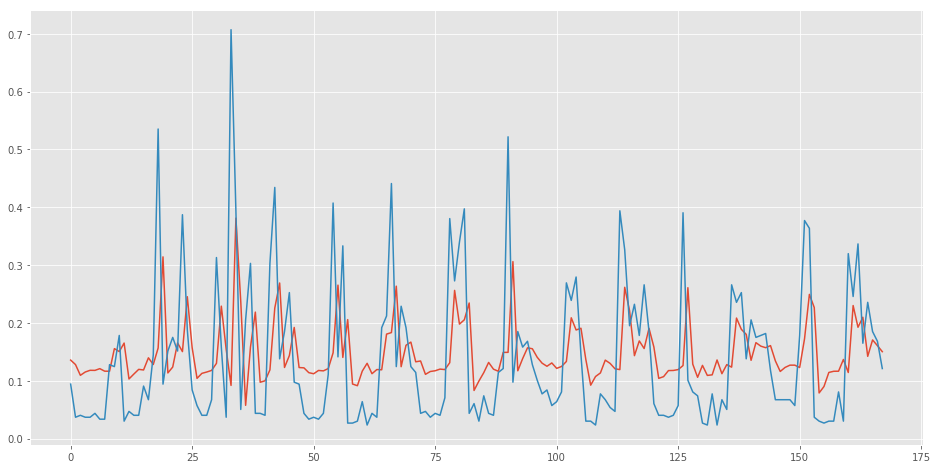

In [20]:
prediction = 0.40651955*test_data['L_1'].values - 0.0392593*test_data['L_2'].values - 0.0778204*test_data['L_3'].values + mean_y[0]

plt.figure(figsize=(16, 8))
plt.plot(prediction)
plt.plot(y)
plt.show()

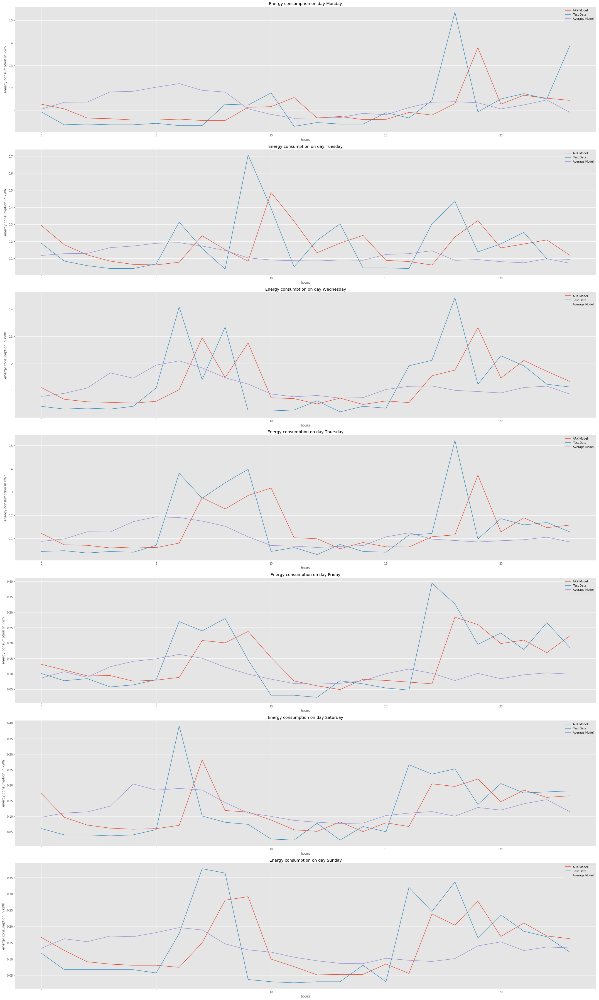

In [21]:
plt.figure(figsize=(30, 50))
day_of_week = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
for i in range(int(train_data['day_of_week'].max())+1):
    num = 711+i
    plt.subplot(num)
    plt.plot(model.predict(test_data[(test_data['day_of_week'] == i)]).values, label='ARX Model')
    plt.plot(test_data[(test_data['day_of_week'] == i)]['energy_consumption'].values, label='Test Data')
    plt.plot(train_data[(train_data['day_of_week'] == i) & (train_data['week_of_year'] == 35)].groupby('hour_of_day').mean()['energy_consumption'].values, label='Average Model')
    plt.xlabel('hours')
    plt.ylabel('energy consumption in kWh')
    plt.title('Energy consumption on day '+ day_of_week[i])
    plt.legend()
    plt.tight_layout()

plt.savefig('arx_weekly_energy_consumption.png')
plt.show()

In [22]:
for i in range(int(train_data['day_of_week'].max())+1):
    mae = mean_absolute_error(test_data[(test_data['day_of_week'] == i)]['energy_consumption'].values, model.predict(test_data[(test_data['day_of_week'] == i)]).values)
    print('Mean Absolute Error for '+str(day_of_week[i])+' ', mae)

Mean Absolute Error for Monday  0.06968631873372641
Mean Absolute Error for Tuesday  0.12791449801671084
Mean Absolute Error for Wednesday  0.0883041509098442
Mean Absolute Error for Thursday  0.08597786344842852
Mean Absolute Error for Friday  0.0601083273098316
Mean Absolute Error for Saturday  0.06321652552380433
Mean Absolute Error for Sunday  0.0729784768636797


## Problem 4: Neural Network Model

In [75]:
def function(w, x, y):
    return 1/2 * sum(np.square(y - np.tanh(np.dot(x, w))))

def gradient(w, x, y):
    m = np.reshape((y - np.tanh(np.dot(x, w)))*(1 - np.square(np.tanh(np.dot(x, w)))), (-1,1))
    return - np.dot(x.T, m)

#def gradient(w, x, y):
#    f = lambda w: 1/2 * sum(np.square(y - np.tanh(np.dot(x, w))))
#    return grad(f)(w)

In [99]:
x = train_data[['L_1', 'L_2', 'L_3']].values
y = train_data['energy_consumption'].values - train_data['mean'].values

In [100]:
def gradient_descent(gradient, gamma, iterations, x, y):
    w_list = np.zeros((iterations, 3))
    gradient_list = np.zeros((iterations, 3))
    w = np.ones((3))
    for i in range(iterations):
        w = np.reshape(w, (-1,))
        w_list[i, :] = w
        grad = np.reshape(gradient(w, x, y), (-1,))
        gradient_list[i, :] = grad
        w = w - gamma * grad
    return w_list, gradient_list

In [102]:
gamma = 0.0001
iterations = 100
w_list, gradient_list = gradient_descent(gradient, gamma, iterations, x, y)

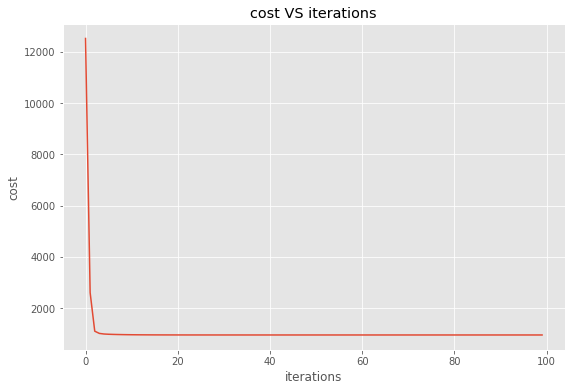

In [103]:
plt.figure(figsize=(9, 6))
plt.plot(range(iterations), [function(w, x, y) for w in w_list])
plt.title('cost VS iterations')
plt.xlabel('iterations')
plt.ylabel('cost')
plt.savefig('cost.png')
plt.show()

In [104]:
print(w_list[-1])

[ 0.41115144 -0.04132197 -0.07996692]


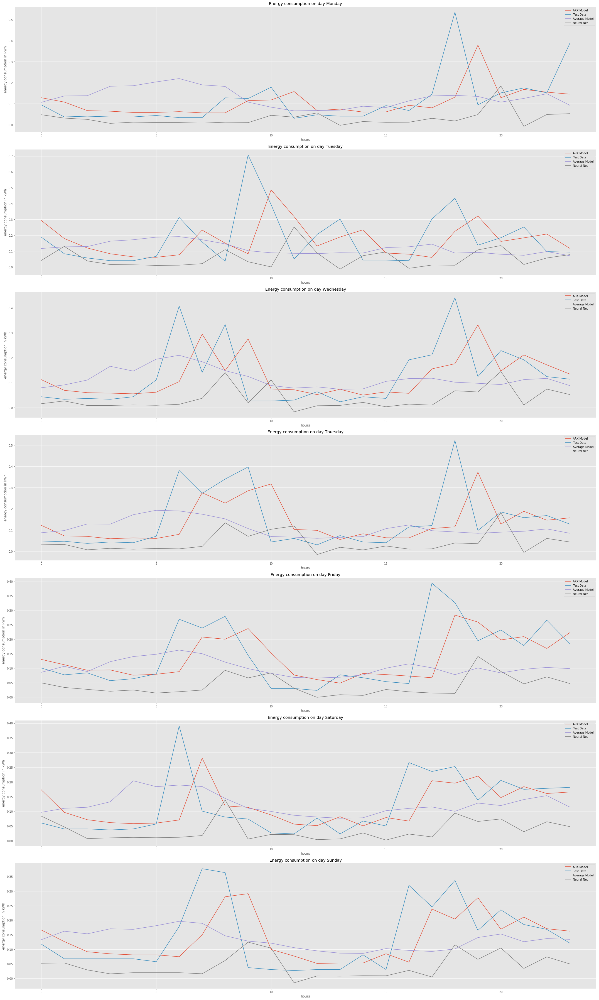

In [105]:
plt.figure(figsize=(30, 50))
day_of_week = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
for i in range(int(train_data['day_of_week'].max())+1):
    num = 711+i
    plt.subplot(num)
    plt.plot(model.predict(test_data[(test_data['day_of_week'] == i)]).values, label='ARX Model')
    plt.plot(test_data[(test_data['day_of_week'] == i)]['energy_consumption'].values, label='Test Data')
    plt.plot(train_data[(train_data['day_of_week'] == i) & (train_data['week_of_year'] == 35)].groupby('hour_of_day').mean()['energy_consumption'].values, label='Average Model')
    x = np.array([test_data[(test_data['day_of_week'] == i)]['L_2'].values, test_data[(test_data['day_of_week'] == i)]['L_2'].values, test_data[(test_data['day_of_week'] == i)]['L_3'].values])
    plt.plot(np.tanh(np.dot(x.T, w_list[-1])), label='Neural Net')
    plt.xlabel('hours')
    plt.ylabel('energy consumption in kWh')
    plt.title('Energy consumption on day '+ day_of_week[i])
    plt.legend()
    plt.tight_layout()

plt.savefig('nn_weekly_energy_consumption.png')
plt.show()

In [106]:
for i in range(int(train_data['day_of_week'].max())+1):
    x = np.array([test_data[(test_data['day_of_week'] == i)]['L_2'].values, test_data[(test_data['day_of_week'] == i)]['L_2'].values, test_data[(test_data['day_of_week'] == i)]['L_3'].values])
    mae = mean_absolute_error(test_data[(test_data['day_of_week'] == i)]['energy_consumption'].values, np.tanh(np.dot(x.T, w_list[-1])))
    print('Mean Absolute Error for '+str(day_of_week[i])+' ', mae)

Mean Absolute Error for Monday  0.0882667853956375
Mean Absolute Error for Tuesday  0.1559812810587138
Mean Absolute Error for Wednesday  0.09869690686840876
Mean Absolute Error for Thursday  0.11325416824252338
Mean Absolute Error for Friday  0.11015052678077947
Mean Absolute Error for Saturday  0.0899277889801043
Mean Absolute Error for Sunday  0.11346411870244938
